In [1]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import pickle
import cv2
from train_classifier import get_hog_features
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import pickle
import cv2
from scipy.ndimage.measurements import label
import numpy as np
import cv2
from skimage.feature import hog

%matplotlib inline

dist_pickle = pickle.load(open("svc_pickle.p", "rb"))
svc = dist_pickle["svc"]
X_scaler = dist_pickle["scaler"]
orient = dist_pickle["orient"]
pix_per_cell = dist_pickle["pix_per_cell"]
cell_per_block = dist_pickle["cell_per_block"]

Processing video


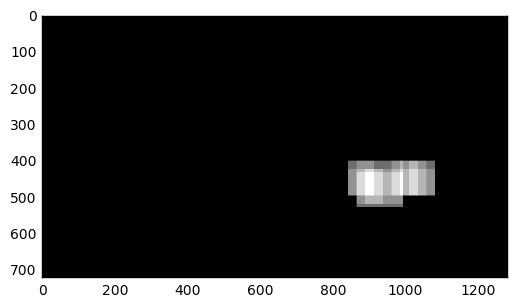

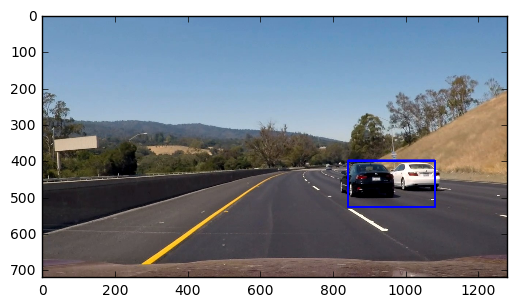

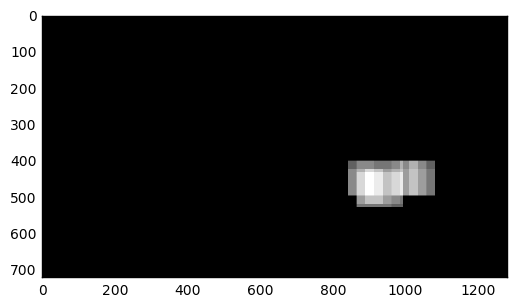

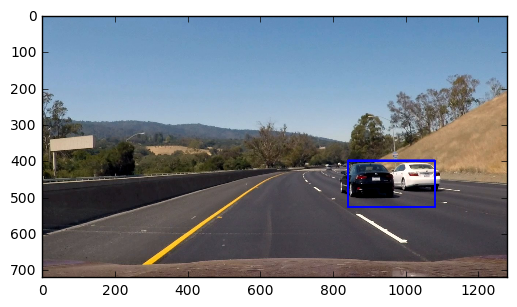

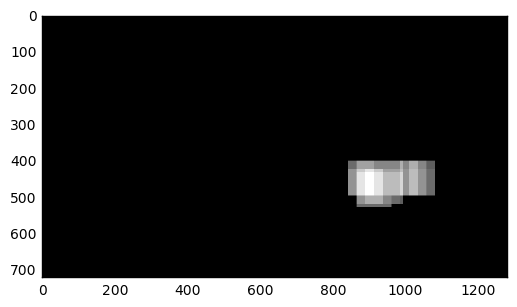

...

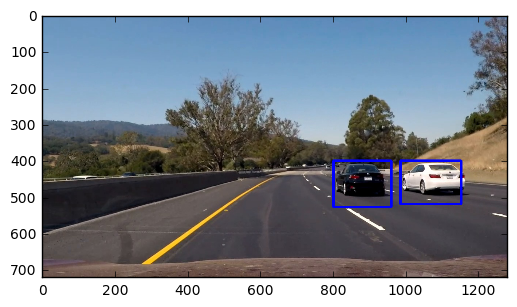

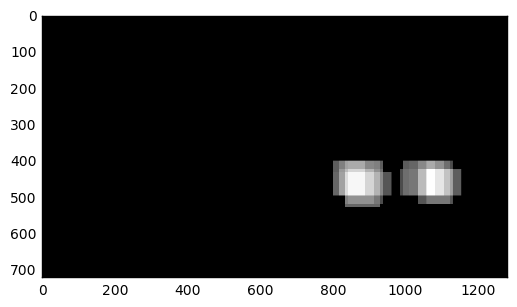

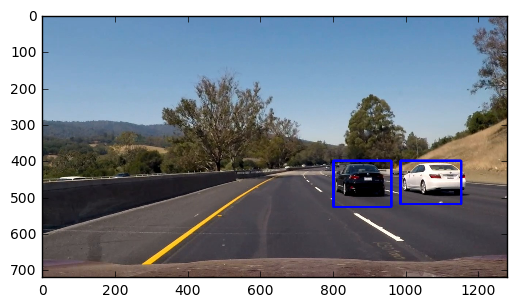

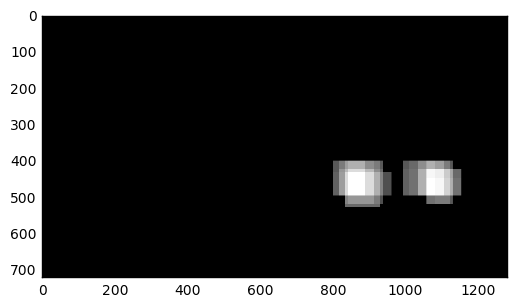

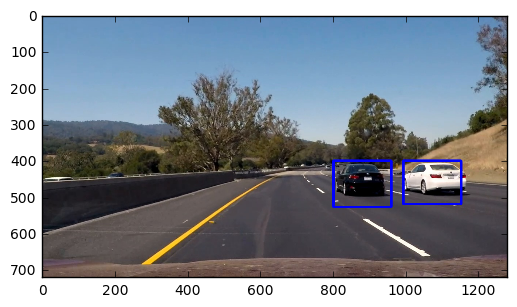

In [18]:
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)


ystart = 400
ystop = 656
scale = 1.5
    
spatial_size = None
hist_bins = None

def find_boxes(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    import time
    #print("Calculating boxes. scale:", scale)
    start = time.time()
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell)-1
    nyblocks = (ch1.shape[0] // pix_per_cell)-1 
    nfeat_per_block = orient*cell_per_block**2
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell)-1 
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    #print("Setup for calculation. Scale:", scale, time.time()-start)
    start = time.time()
    # Compute individual channel HOG features for the entire image
    hogs = [get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False), get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False), get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)]

    hog1 = hogs[0] #get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = hogs[1] #get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = hogs[2] #get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    #print("HOG whole image. Scale:", scale, time.time()-start)
    start = time.time()
    boxes = []
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((hog_features)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                box = (xbox_left, ytop_draw+ystart), (xbox_left+win_draw, ytop_draw+win_draw+ystart)
                boxes.append(box)
    #print("Test against test features. Scale:", scale, time.time()-start)
    start = time.time()
    return boxes

def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def calculate_labeled_bboxes(labels):
    labeled_bboxes = []
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        labeled_bboxes.append(bbox)
    return labeled_bboxes
    
def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for bbox in calculate_labeled_bboxes(labels):
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
        
    # Return the image
    return img

print("Processing video")


class CarTracker:
    index = 0
    labels = []

    def next(self):
        self.index = self.index + 1
        return self.index - 1

car_tracker = CarTracker()

class HeatTracker:
    def __init__(self):
        self.boxes_list = []
    
    def addBoxes(self, boxes):
        self.boxes_list.append(boxes)
        if len(self.boxes_list) > 4:
            self.boxes_list.pop(0)
        return len(self.boxes_list)
    
    def allBoxes(self):
        all_boxes = []
        for boxes in self.boxes_list:
            all_boxes.extend(boxes)
        return all_boxes

heat_tracker = HeatTracker()

def process_image(image):
    import time
    start = time.time()
    
        
    boxes = []
    
    for scale in [1.5, 2, 3, 4, 8]:
        boxes.extend(find_boxes(image, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins))

    threshold_n = heat_tracker.addBoxes(boxes)
    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    heat = add_heat(heat,heat_tracker.allBoxes())
    
    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,threshold_n * 2)
    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    plt.imshow(heatmap, cmap="gray")
    plt.show()
    # Find final boxes from heatmap using label function
    car_tracker.labels = label(heatmap)

    draw_img = draw_labeled_bboxes(np.copy(image), car_tracker.labels)

    return draw_img

images = [mpimg.imread('./mp4_imgs/image_' + str(index).zfill(3) + '.jpg') for index in range(900,950)]

for image in images:
    img = process_image(image)
    plt.imshow(img)
    plt.show()
    
